Augustin Notes:
* There are many ways to run a sensitivity analysis, but what I suggest is that you look into one-way and multiple-way sensitivity analyses. Simple and efficient.
* I like how this economics class makes it very natural to describe a one-way analysis. One variable changes, all others are set: pretty much what happens in MaxEnt. https://www2.seas.gwu.edu/~dorpjr/EMSE269/Lecture%20Notes/Chapter%205.pdf

You will see that the slides also cover two-ways sensitivity analyses --and this is where it becomes interesting. Climate-wise, some variables vary independently but many are coupled (ie temperature). This is where you should consider the physical relationship between your variables to build n-ways sensitivity analyses, where you vary n variables together to understand cumulative effects. The relation between the rate of change of the n variables is up to you and I am curious to hear what you think... An example on temperature: you could assume that the average temperature, max temperature, and min temperature vary in the same way. So if the mean temperature gains 0.1C, then the max and min also increase by 0.1C. Reasonable. However, looking at the temperature distribution in mediterranean countries, you may notice that the proportionality between mean and max temperature is actually different, and an increase in mean by 0.1C is accompanied by an increase >0.1C in max temperature. By using this information in your n-way sensitivity analysis, you are increasing the amount of physics constraints in your study. As a result, the outcome is more realistic!


In [1]:
from IPython.display import Image

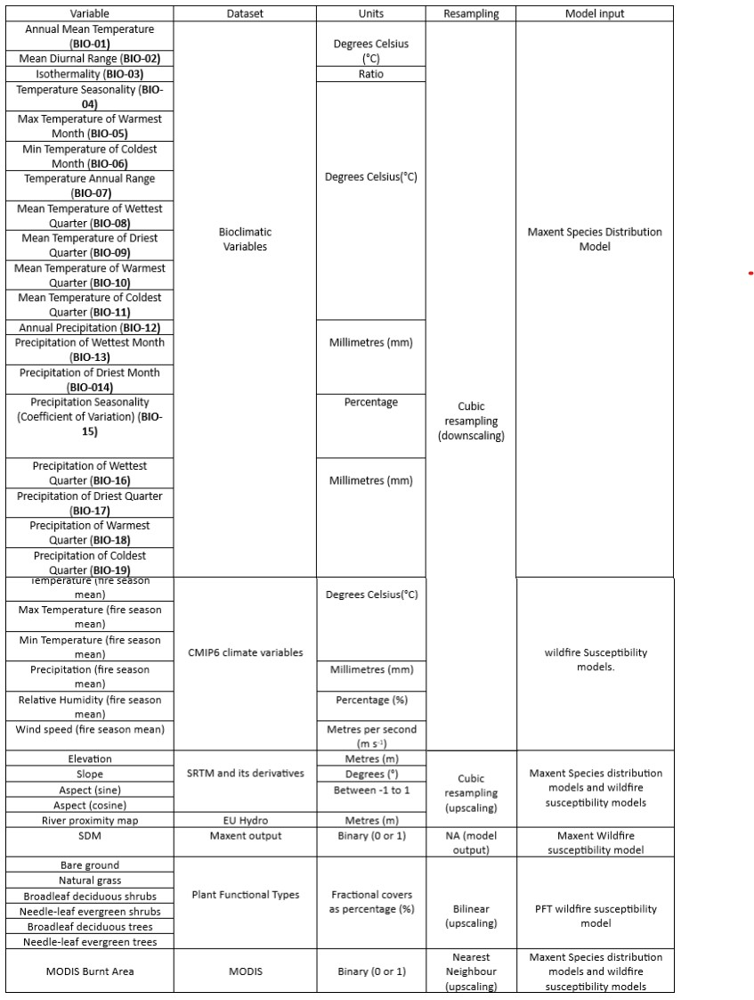

In [2]:
Image("Images/Trisung_Bioclimatic_Vars.jpg")

# Sensitivity Analysis

## 1. Import Python Packages:

In [3]:
# !pip install georasters

In [4]:
import os
import shutil
import numpy as np
import pandas as pd
import geopandas as gpd
import georasters as gr
import matplotlib.pyplot as plt

## 2. One Way Sensitivity Analysis With Temperature Bioclimatic Variables
* (DONE) BIO-1: Annual Mean Temperature
* (NEXT) BIO-14: Precipitation of Driest Month


### Initial Historical Bioclimatic Variables Test for 2001

In [5]:
# Import the base raster data
bio1_raster = gr.from_file("./../../Data/Intermediate/BioClim/SSP245/2001/bio1_2001.tif")

c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\osgeo\gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\colors.py:744: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


<Axes: >

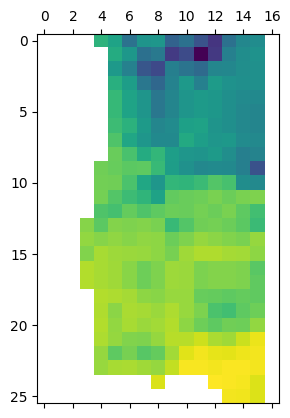

In [6]:
bio1_raster.plot()

In [7]:
base_bio1 = bio1_raster.to_pandas()

In [8]:
base_bio1

,value,x,y,row,col
0,14.515274,131547.352454,591454.261788,1,4
1,13.729556,155931.975742,591454.261788,1,6
2,11.333753,180316.599029,591454.261788,0,6
3,12.979711,204701.222316,591454.261788,0,8
4,13.069979,229085.845604,591454.261788,0,8
...,...,...,...,...,...
264,18.531681,375393.585329,6223.302889,24,14
265,18.068144,399778.208616,6223.302889,24,16
266,18.491741,351008.962041,-18161.320399,26,13
267,18.415531,375393.585329,-18161.320399,26,14


Under the SSP245 scenario, average near surface temperatures are likely to be higher by 1.3°C–2.4°C. Lets average this range and use the resulting value to get the minimum and maximum rasters for BIO-1 

https://sealevel.nasa.gov/ipcc-ar6-sea-level-projection-tool?psmsl_id=1476&info=true

In [9]:
shift_value = 5.6 / 2 # (2.1 + 3.5) / 2
shift_value

2.8

So we now shift all cell values by 1.85 °C to get the minimum and maximum mean annual temperature values

In [10]:
min_bio1_raster = bio1_raster - shift_value

c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\colors.py:744: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


<Axes: >

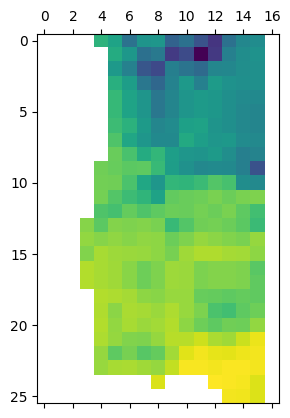

In [11]:
min_bio1_raster.plot()

In [12]:
min_bio1_raster.to_pandas()

,value,x,y,row,col
0,11.715274,131547.352454,591454.261788,1,4
1,10.929556,155931.975742,591454.261788,1,6
2,8.533752,180316.599029,591454.261788,0,6
3,10.179710,204701.222316,591454.261788,0,8
4,10.269979,229085.845604,591454.261788,0,8
...,...,...,...,...,...
264,15.731681,375393.585329,6223.302889,24,14
265,15.268144,399778.208616,6223.302889,24,16
266,15.691741,351008.962041,-18161.320399,26,13
267,15.615531,375393.585329,-18161.320399,26,14


In [13]:
(min_bio1_raster * shift_value).to_pandas()

c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:1020: RuntimeWarning: overflow encountered in multiply
  result = self.f(da, db, *args, **kwargs)


,value,x,y,row,col
0,32.802765,131547.352454,591454.261788,1,4
1,30.602757,155931.975742,591454.261788,1,6
2,23.894506,180316.599029,591454.261788,0,6
3,28.503189,204701.222316,591454.261788,0,8
4,28.755939,229085.845604,591454.261788,0,8
...,...,...,...,...,...
264,44.048706,375393.585329,6223.302889,24,14
265,42.750801,399778.208616,6223.302889,24,16
266,43.936874,351008.962041,-18161.320399,26,13
267,43.723488,375393.585329,-18161.320399,26,14


In [14]:
max_bio1_raster = bio1_raster + shift_value

c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\colors.py:744: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


<Axes: >

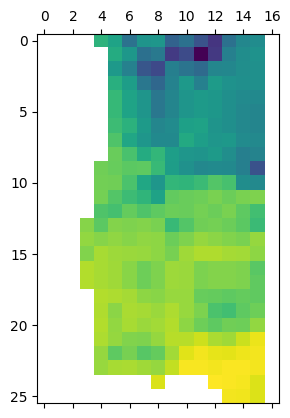

In [15]:
max_bio1_raster.plot()

In [16]:
max_bio1_raster.to_pandas()

,value,x,y,row,col
0,17.315273,131547.352454,591454.261788,1,4
1,16.529556,155931.975742,591454.261788,1,6
2,14.133753,180316.599029,591454.261788,0,6
3,15.779711,204701.222316,591454.261788,0,8
4,15.869979,229085.845604,591454.261788,0,8
...,...,...,...,...,...
264,21.331680,375393.585329,6223.302889,24,14
265,20.868143,399778.208616,6223.302889,24,16
266,21.291740,351008.962041,-18161.320399,26,13
267,21.215530,375393.585329,-18161.320399,26,14


In [17]:
max_bio1_raster.to_tiff("test")

In [18]:
bio14_raster = gr.from_file("./../../Data/Intermediate/BioClim/SSP245/2001/bio14_2001.tif")

c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\image.py:499: RuntimeWarning: overflow encountered in divide
  A_scaled /= ((a_max - a_min) / frac)


<Axes: >

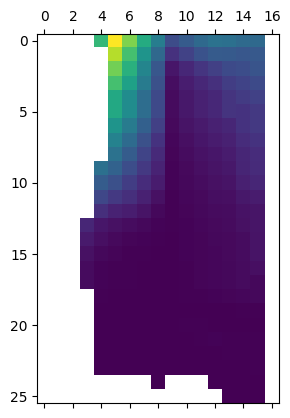

In [19]:
bio14_raster.plot()

In [20]:
bio14_df = bio14_raster.to_pandas()
bio14_df.head(10)

,value,x,y,row,col
0,0.466469,131547.352454,591454.261788,1,4
1,0.700378,155931.975742,591454.261788,1,6
2,0.564198,180316.599029,591454.261788,0,6
3,0.429855,204701.222316,591454.261788,0,8
4,0.297348,229085.845604,591454.261788,0,8
5,0.161816,253470.468891,591454.261788,0,10
6,0.199959,277855.092179,591454.261788,1,10
7,0.240719,302239.715466,591454.261788,1,12
8,0.265046,326624.338754,591454.261788,1,12
9,0.259343,351008.962041,591454.261788,1,13


In [21]:
print(bio14_df.value.min())
print(bio14_df.value.max())

7.5225225373287685e-06
0.7003775238990784


### Generate tiff files for Shifted variables for all historical and ssp245 years

In [33]:
data_path = "./Data/Input"

if os.path.exists(data_path):
    try:
        shutil.rmtree(data_path)
    except Exception as e:
        print(f"Error removing directory: {e}")
        
os.makedirs(data_path)

In [ ]:
def create_min_max_rasters(year_start : int, year_end : int, shift_value : float, bio_var : str, min_output_path : str, max_output_path : str):
    bio_raster = gr.from_file(f"./../../Data/Intermediate/Averaged_data/SSP245/Bioclim_avg/Bio_{bio_var}/Bio_{bio_var}_{year_start}-{year_end}.tif")
    min_bio1_raster = bio_raster - shift_value
    max_bio1_raster = bio_raster + shift_value

    min_bio1_raster.to_tiff(os.path.join(min_output_path, f"Bio_{bio_var}/Bio_{bio_var}_{year_start}-{year_end}.tif"))
    max_bio1_raster.to_tiff(os.path.join(max_output_path, f"Bio_{bio_var}/Bio_{bio_var}_{year_start}-{year_end}.tif"))


# Copy rasters we aren't changing
def create_climate_input(year_start, year_end, shift_value : float, bio_var : int):   
    print(f"Generating min and max rasters for {year_start} to {year_end}")
    for i in range(1,20):  
        if i < 10:
            str_bio_var = f"0{i}"
        else:
            str_bio_var = str(i)
        
        # Create variable directory
        min_output_path = f"./Data/Input/min_bio{bio_var}/Averaged_data/SSP245/Bioclim_avg"
        max_output_path = f"./Data/Input/max_bio{bio_var}/Averaged_data/SSP245/Bioclim_avg"
        
        os.makedirs(os.path.join(min_output_path, f"Bio_{str_bio_var}"), exist_ok = True)
        os.makedirs(os.path.join(max_output_path, f"Bio_{str_bio_var}"), exist_ok = True)
        
        if i == bio_var:
            create_min_max_rasters(year_start, year_end, shift_value, str_bio_var, min_output_path, max_output_path)
            continue
        
        raster = gr.from_file(f"./../../Data/Intermediate/Averaged_data/SSP245/Bioclim_avg/Bio_{str_bio_var}/Bio_{str_bio_var}_{year_start}-{year_end}.tif")
        raster.to_tiff(os.path.join(min_output_path, f"Bio_{str_bio_var}/Bio_{str_bio_var}_{year_start}-{year_end}.tif"))
        raster.to_tiff(os.path.join(max_output_path, f"Bio_{str_bio_var}/Bio_{str_bio_var}_{year_start}-{year_end}.tif"))
    print("Raster Generation Complete.\n")    

In [34]:
# Set shift values for BIO-1 and BIO-14
bio1_shift_value = shift_value  # Units = Degrees Celsius
bio14_shift_value = 14.0        # Units = mm of precipitation (DETERMINE THIS TOMORROW)

In [35]:
# BIO-1
create_climate_input(2001, 2014, bio1_shift_value, 1) # Historical
create_climate_input(2087, 2100, bio1_shift_value, 1) # Future SSP245

Generating min and max rasters for 2001 to 2014
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Raster Generation Complete.

Generating min and max rasters for 2087 to 2100
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Raster Generation Complete.



In [27]:
# # BIO-14
# create_min_max_rasters(years = range(2001, 2015), shift_value = bio14_shift_value, bio_var = 14) # Historical
# create_min_max_rasters(years = range(2087, 2101), shift_value = bio14_shift_value, bio_var = 14) # Future SSP245

Generating min and max rasters for 2001
Generating min and max rasters for 2002
Generating min and max rasters for 2003
Generating min and max rasters for 2004
Generating min and max rasters for 2005
Generating min and max rasters for 2006
Generating min and max rasters for 2007
Generating min and max rasters for 2008
Generating min and max rasters for 2009
Generating min and max rasters for 2010
Generating min and max rasters for 2011
Generating min and max rasters for 2012
Generating min and max rasters for 2013
Generating min and max rasters for 2014
Raster Generation Complete.

Generating min and max rasters for 2087
Generating min and max rasters for 2088
Generating min and max rasters for 2089
Generating min and max rasters for 2090
Generating min and max rasters for 2091
Generating min and max rasters for 2092
Generating min and max rasters for 2093
Generating min and max rasters for 2094
Generating min and max rasters for 2095
Generating min and max rasters for 2096
Generating 

### Running Maxent

From here, the min and max rasters should be downloaded as individual .tif files. You can now run MaxEnt with them. There is no automation here, just swap in the varibles into the correct directories and run MaxEnt. Run MaxEnt for all min, base, and max rasters for each bioclimatic variable.

### Display MaxEnt Results for each shifted bioclimatic variable

In [8]:
def plot_2_subplots(raster1, raster2, species, difference=False, Future=False, type = ""):
    # Helper function to extract raster data as a NumPy array
    def extract_array(raster):
        if hasattr(raster, 'raster'):  # Check if it's a GeoRaster object
            return np.nan_to_num(raster.raster, nan=0.0)  # Replace NaN with 0
        elif isinstance(raster, np.ndarray):  # Already a NumPy array
            return np.nan_to_num(raster, nan=0.0)
        else:
            raise ValueError("Unsupported raster format. Must be GeoRaster or NumPy array.")
    
    # Extract data from both rasters
    array1 = extract_array(raster1)
    array2 = extract_array(raster2)
    
    time = "Future" if Future else "Present"
    
    # Create figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))

    # Plot first raster on the first subplot without colorbar
    im1 = ax1.imshow(array1, cmap='viridis', vmin=0, vmax=1)  # Set vmin/vmax as appropriate
    # ax1.set_title(f'{time} {species} Distribution: Max - Base')
    ax1.set_title(f'Present {type} {species} Distribution')
    ax1.axis('off')

    # Remove the colorbar completely
    cbar1 = fig.colorbar(im1, ax=ax1)
    cbar1.remove()  # This removes the colorbar from the figure

    # Plot second raster on the second subplot with colorbar
    im2 = ax2.imshow(array2, cmap='viridis', vmin=0, vmax=1)  # Adjust vmin/vmax if needed
    
    # ax2.set_title(f'{time} {species} Distribution: Base - Min')
    ax2.set_title(f'Future {type} {species} Distribution')
    ax2.axis('off')

    # Add colorbar for the second raster
    cbar2 = fig.colorbar(im2, ax=ax2)
    cbar2.set_label(f'{species} Density')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

    # Verify that the colorbar is removed
    # assert cbar1 is None, f"The colorbar should be removed, but it still exists."

SyntaxError: parameter without a default follows parameter with a default (2620597207.py, line 1)

In [6]:
def generate_species_plots(bio_var : int):    
    print(f"Generating plots for BIO-{bio_var}.")
    for species in ["Acacia", "Castanea sativa", "Eucalyptus", "Pinus pinaster", "Pinus pinea", "Quercus rotundifolia", "Quercus suber"]:
        print(f"{species}:")
        
        min_hist = gr.from_file(f"./Data/Output/min_bio{bio_var}/SSP245/{species}/present_PP_{species}.tif")
        min_future = gr.from_file(f"./Data/Output/min_bio{bio_var}/SSP245/{species}/future_PP_{species}.tif")

        base_hist = gr.from_file(f"./Data/Output/base/SSP245/{species}/present_PP_{species}.tif")
        base_future = gr.from_file(f"./Data/Output/base/SSP245/{species}/future_PP_{species}.tif")

        max_hist = gr.from_file(f"./Data/Output/max_bio{bio_var}/SSP245/{species}/present_PP_{species}.tif")
        max_future = gr.from_file(f"./Data/Output/max_bio{bio_var}/SSP245/{species}/future_PP_{species}.tif")
        
        max_base_acacia_hist = max_hist - base_hist
        base_min_acacia_hist = base_hist - min_hist
        
        max_base_acacia_future = max_future - base_future
        base_min_acacia_future = base_future - min_future   
        
        plot_2_subplots(min_hist, min_future, species)
        plot_2_subplots(base_hist, base_future, species)
        plot_2_subplots(max_hist, max_future, species)
        # plot_2_subplots(max_base_acacia_hist, base_min_acacia_hist, species, difference = True)
        # plot_2_subplots(max_base_acacia_future, base_min_acacia_future, species, difference = True, Future = True)
    print(f"Plots for BIO-{bio_var} complete.")

Generating plots for BIO-1.
Acacia:


c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\osgeo\gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


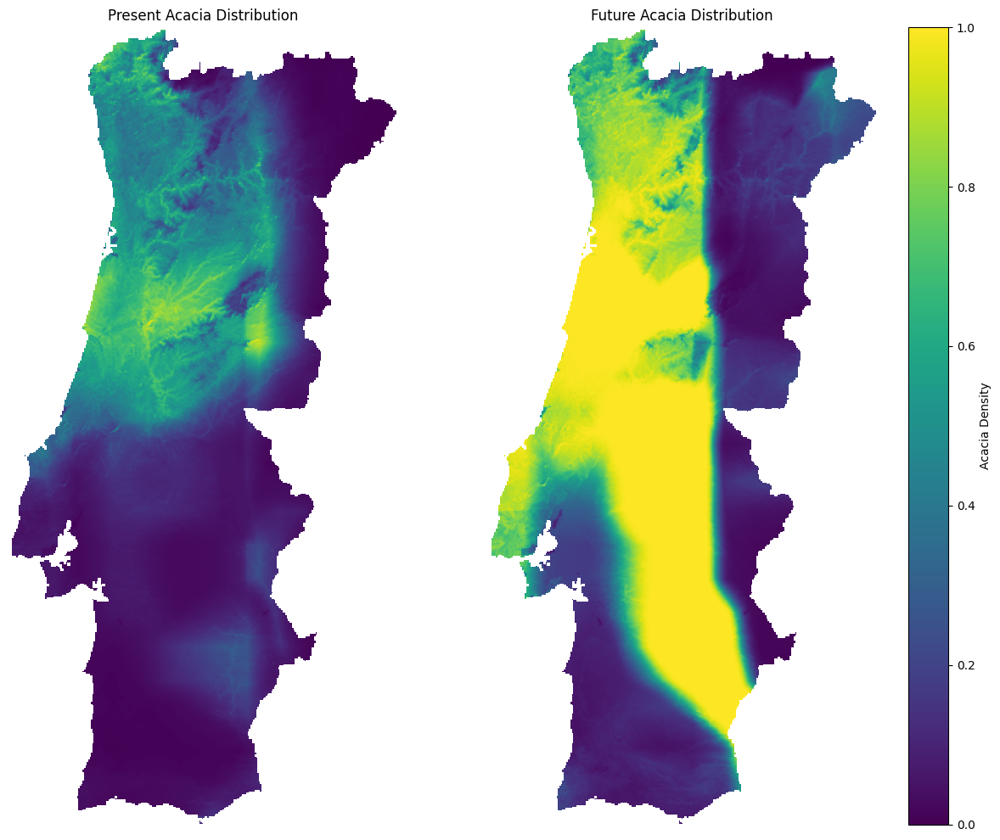

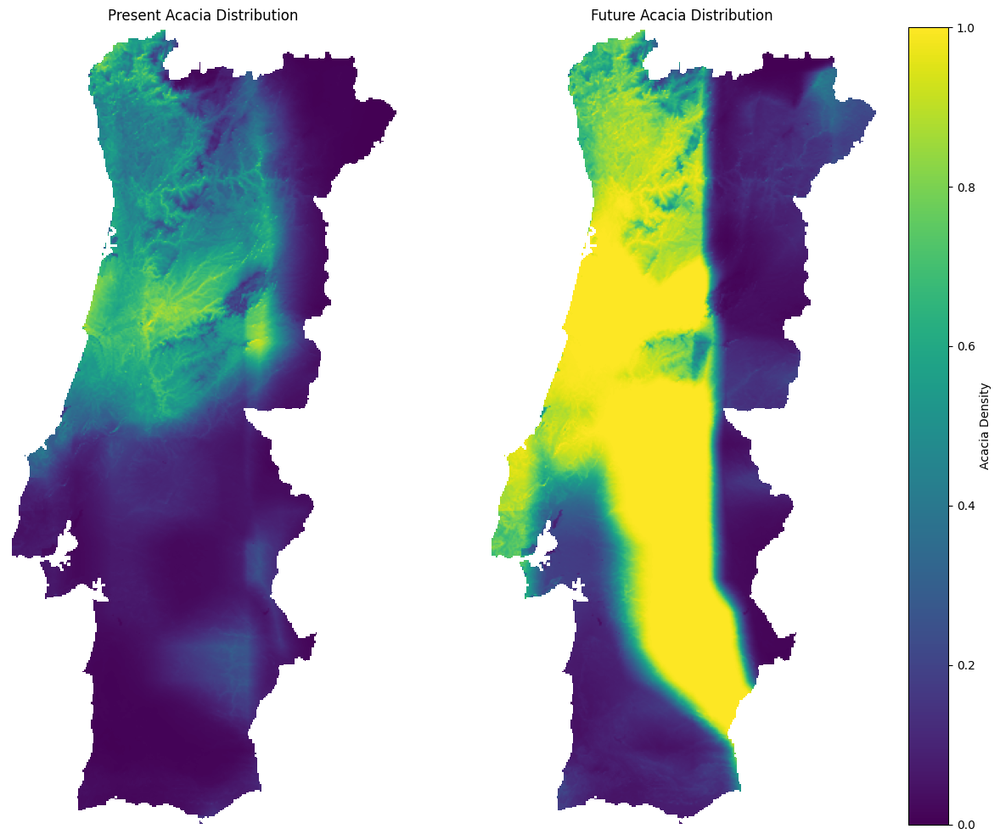

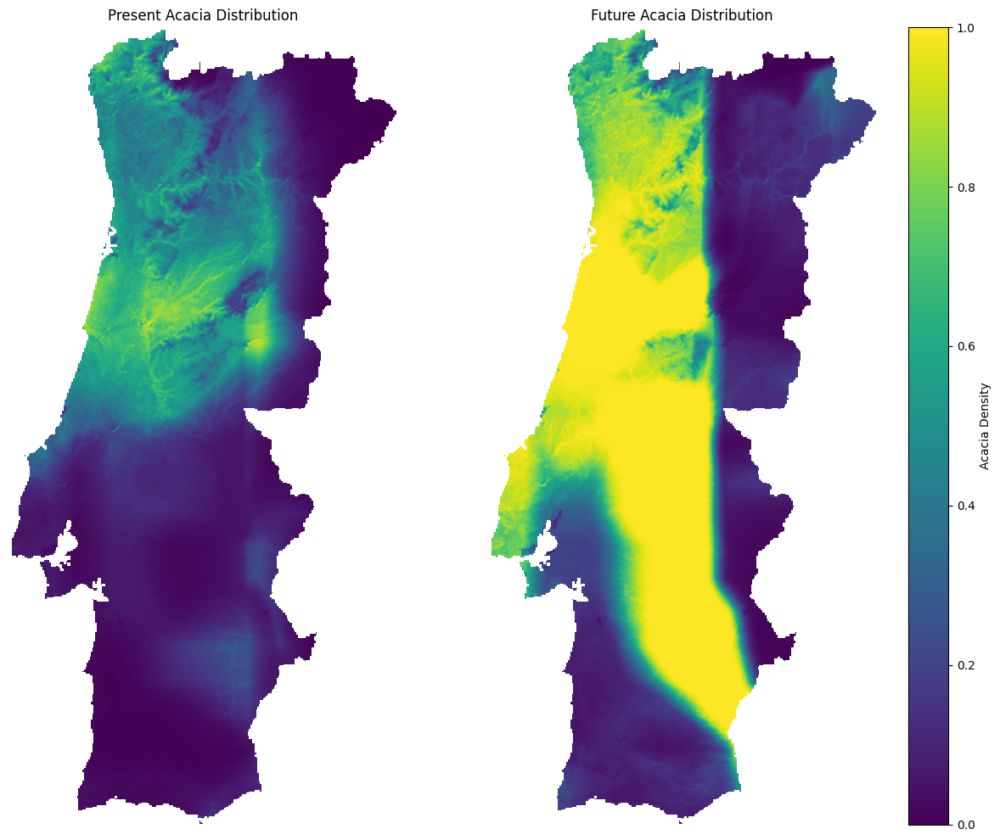

Castanea sativa:


c:\Users\ntobi\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\image.py:499: RuntimeWarning: overflow encountered in divide
  A_scaled /= ((a_max - a_min) / frac)


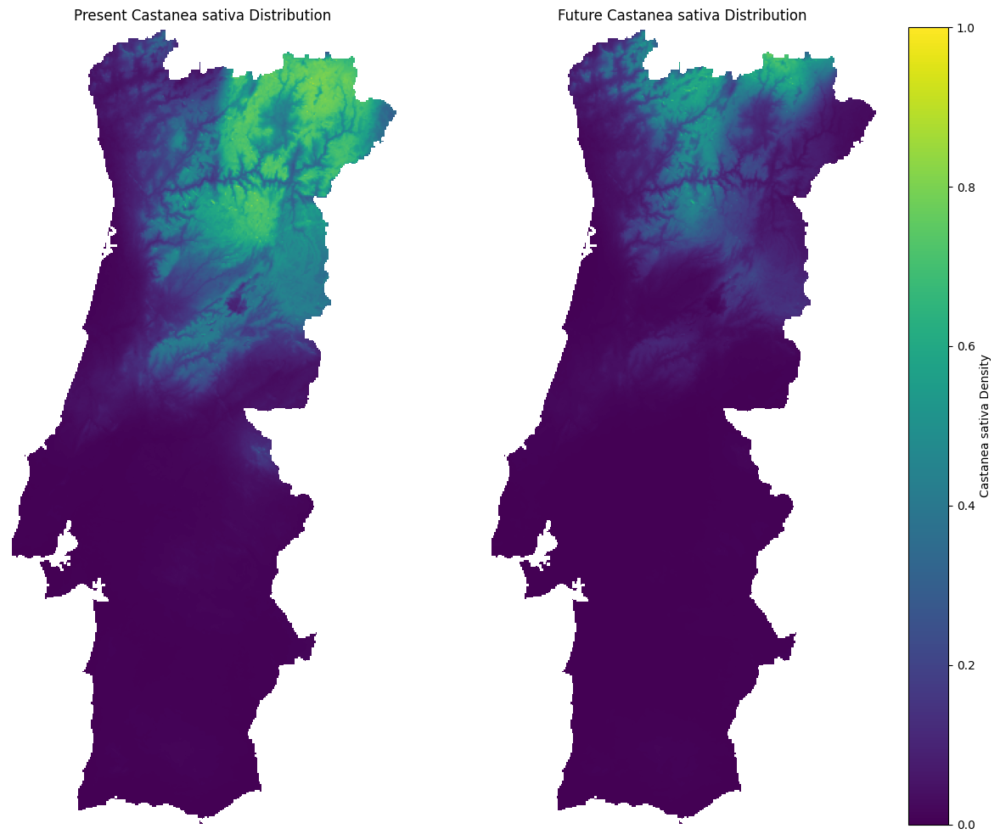

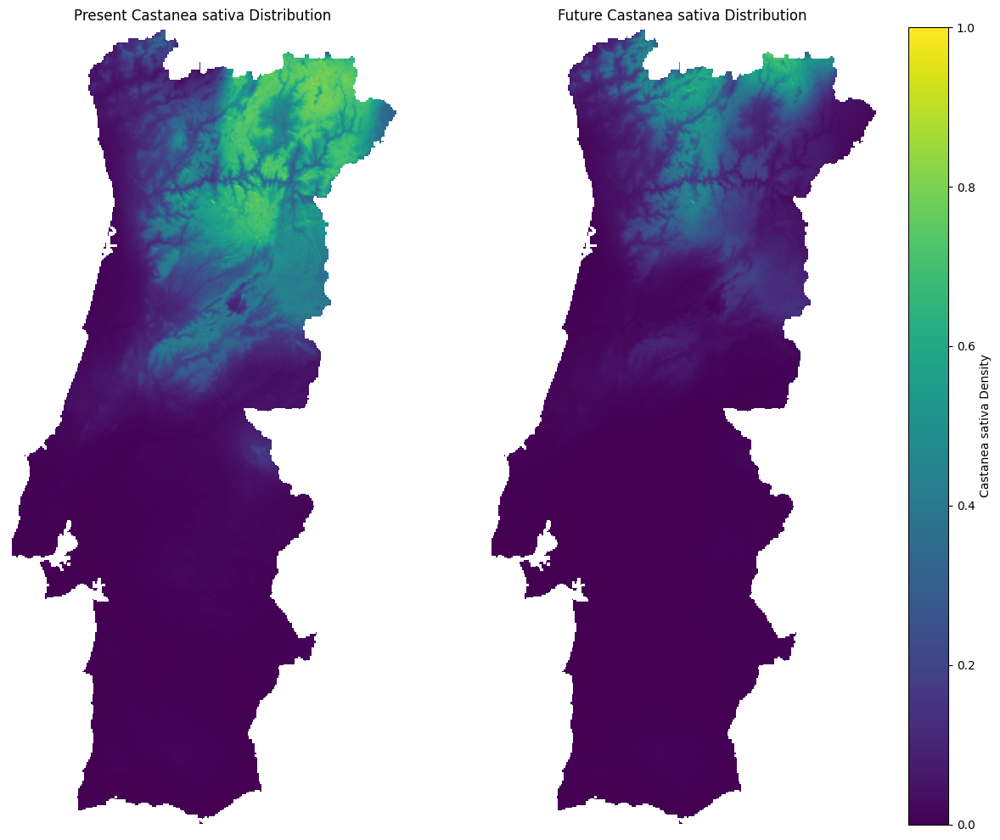

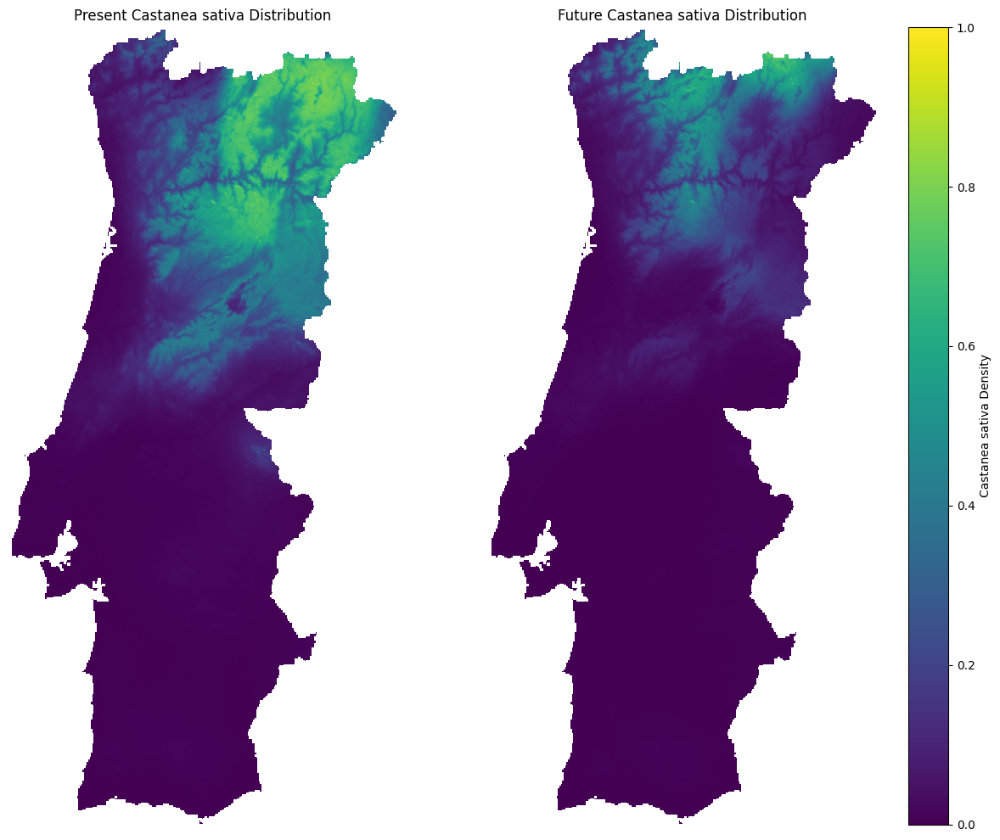

Eucalyptus:


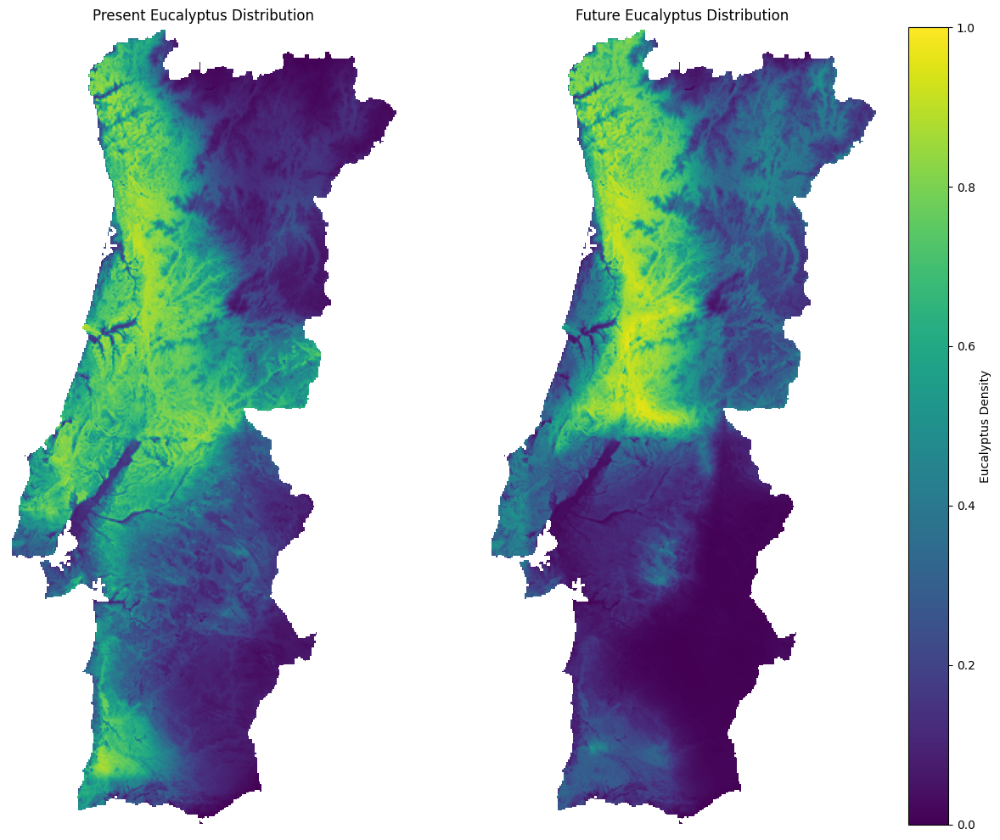

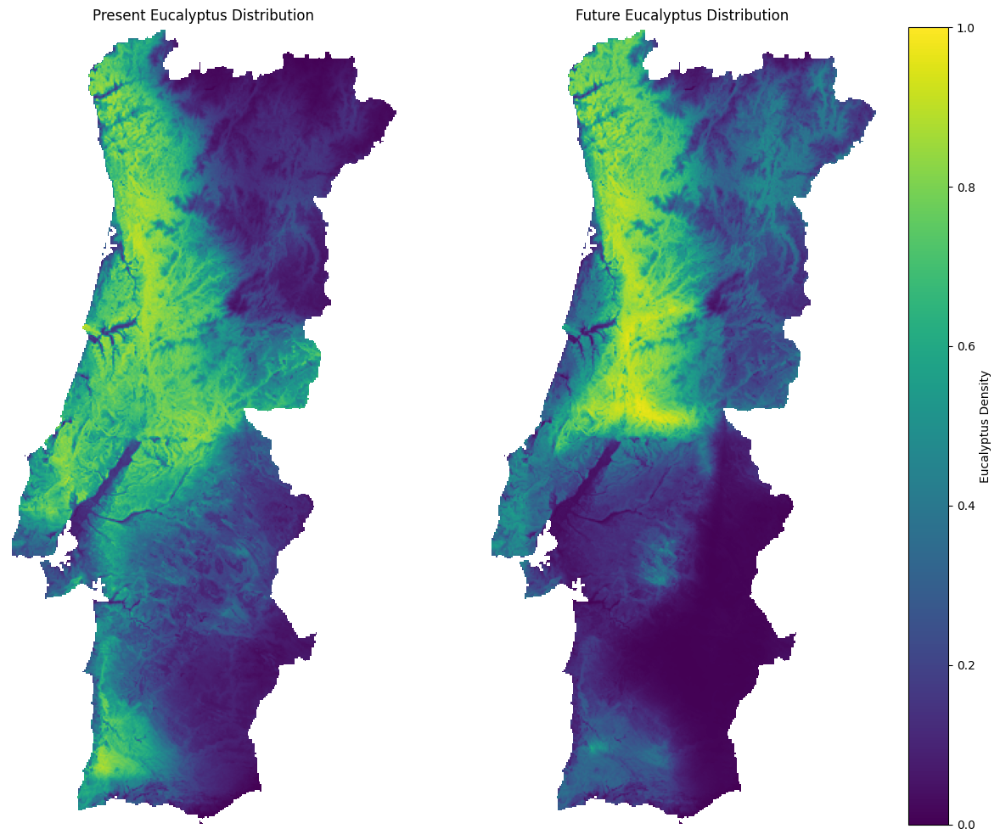

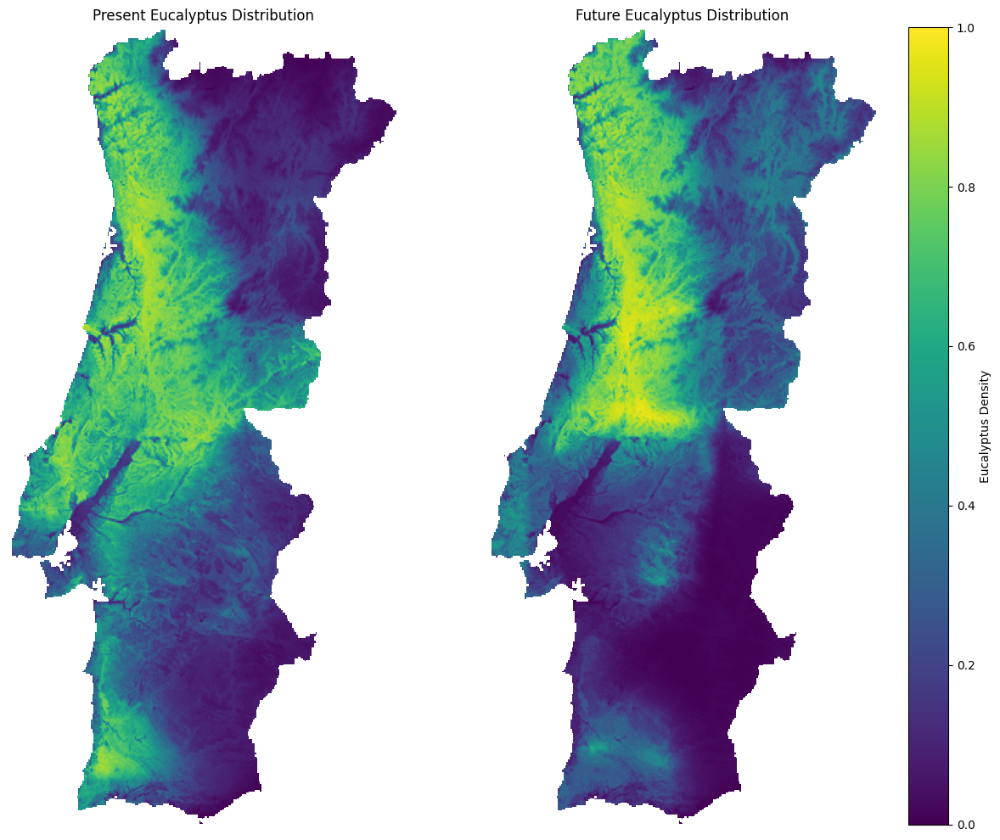

Pinus pinaster:


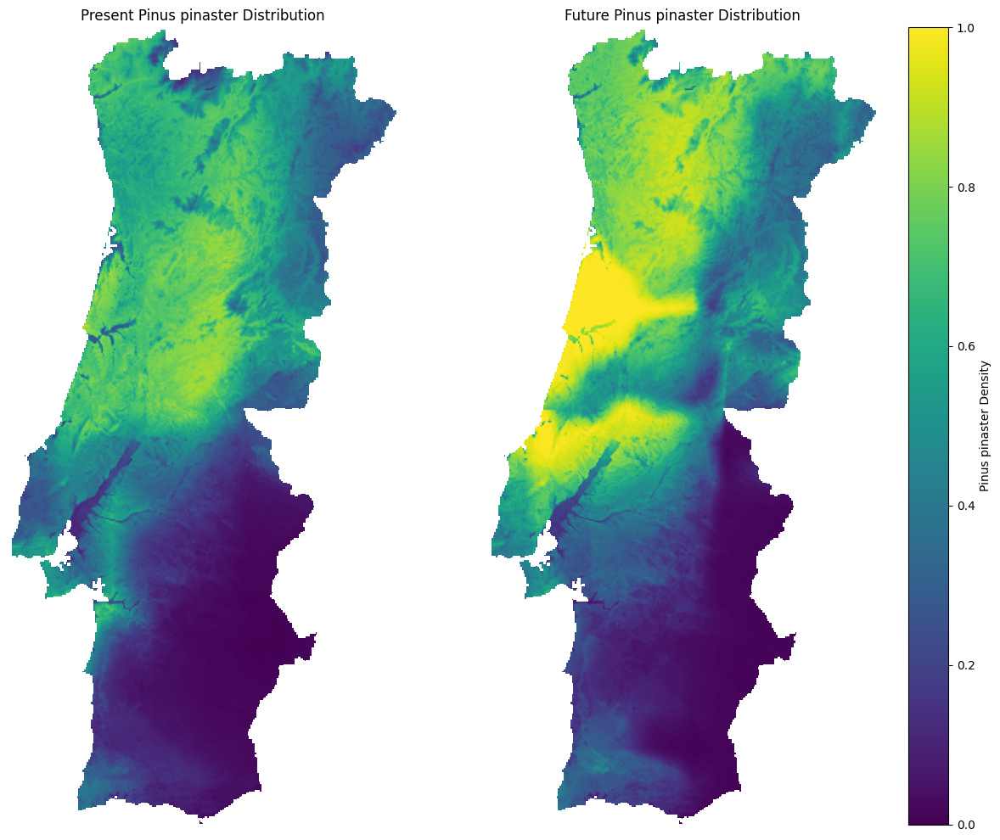

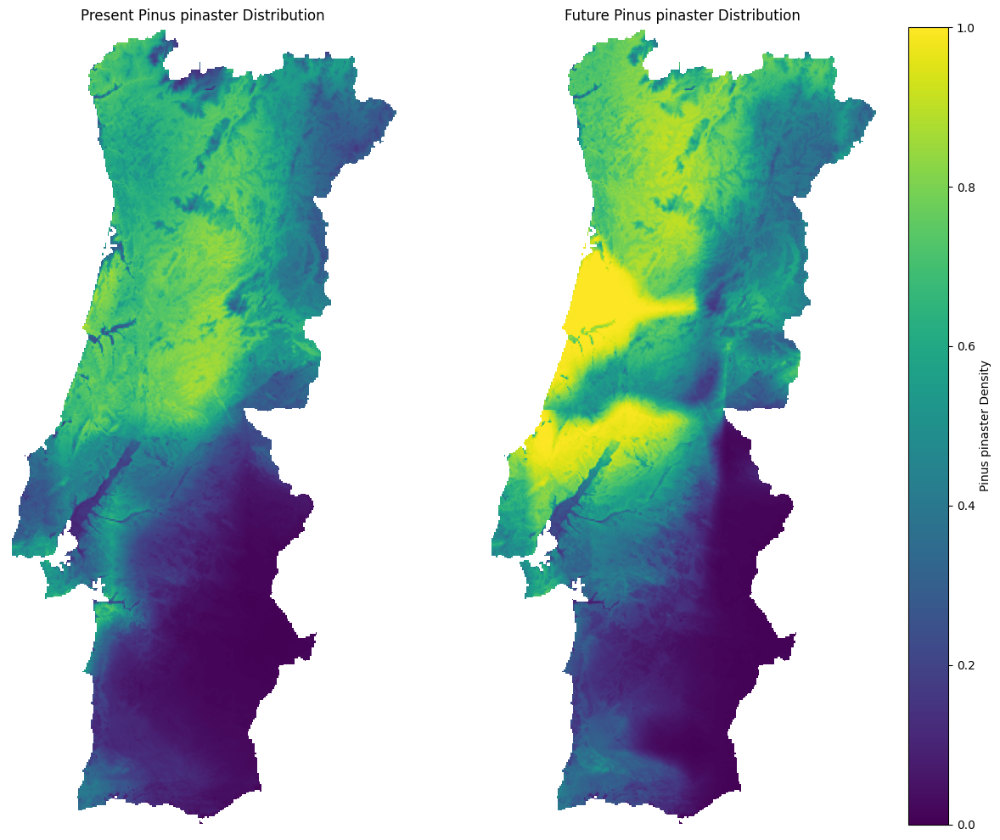

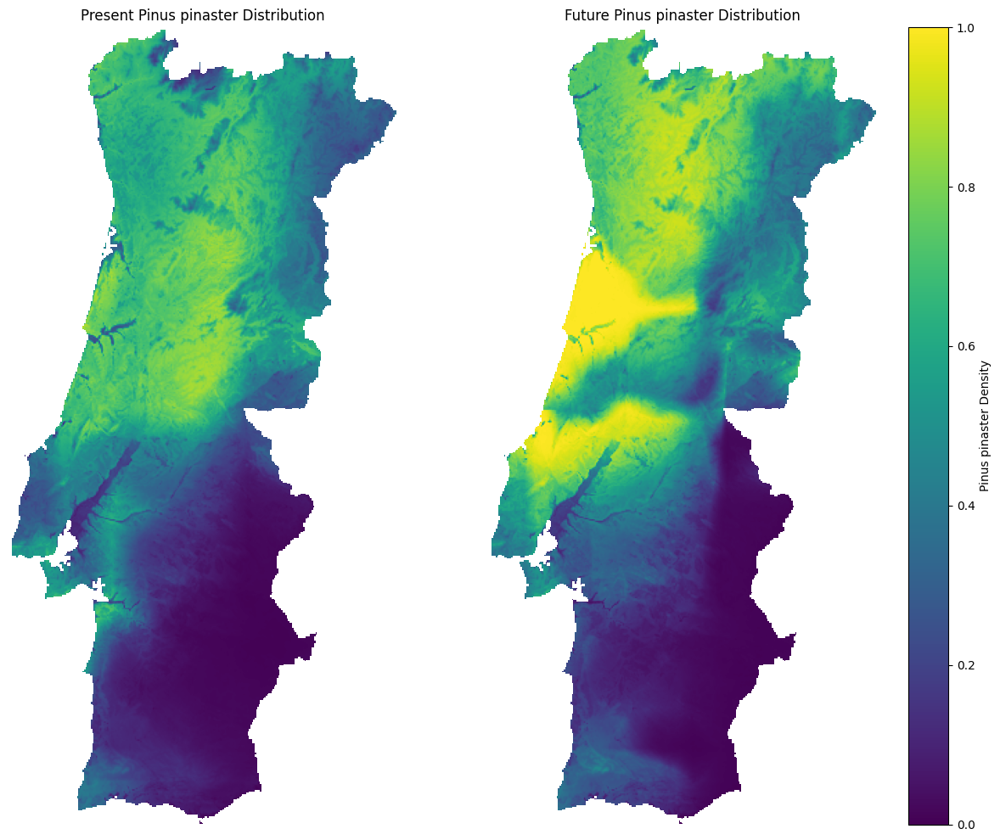

Pinus pinea:


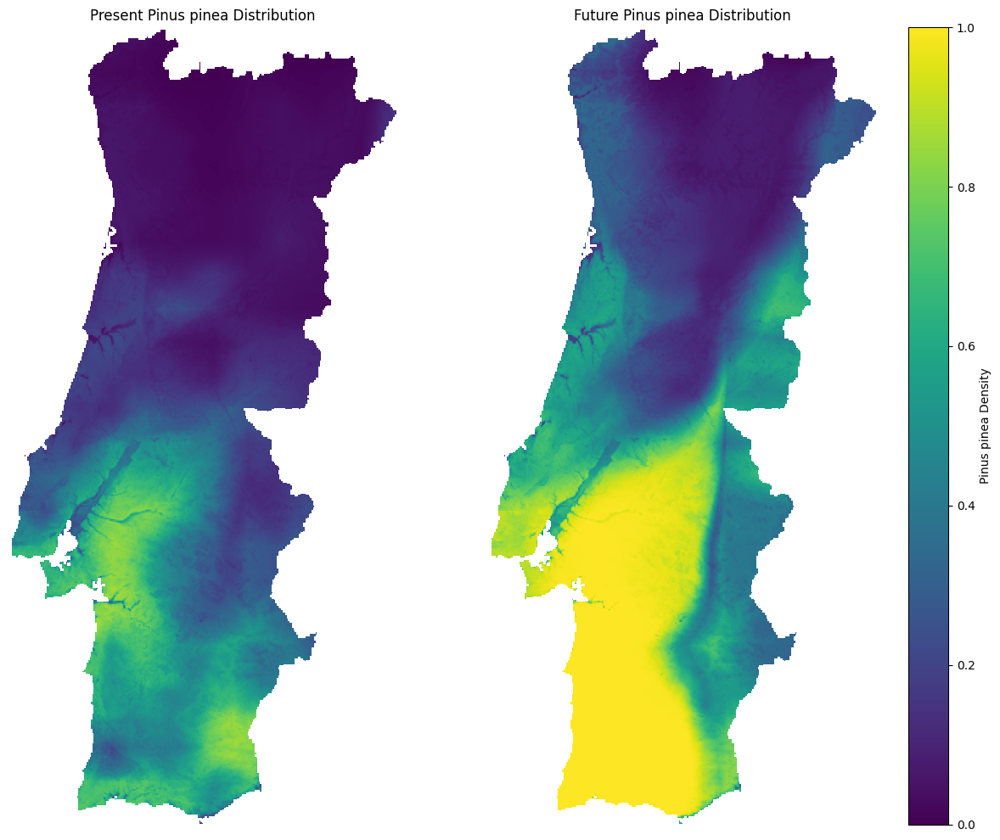

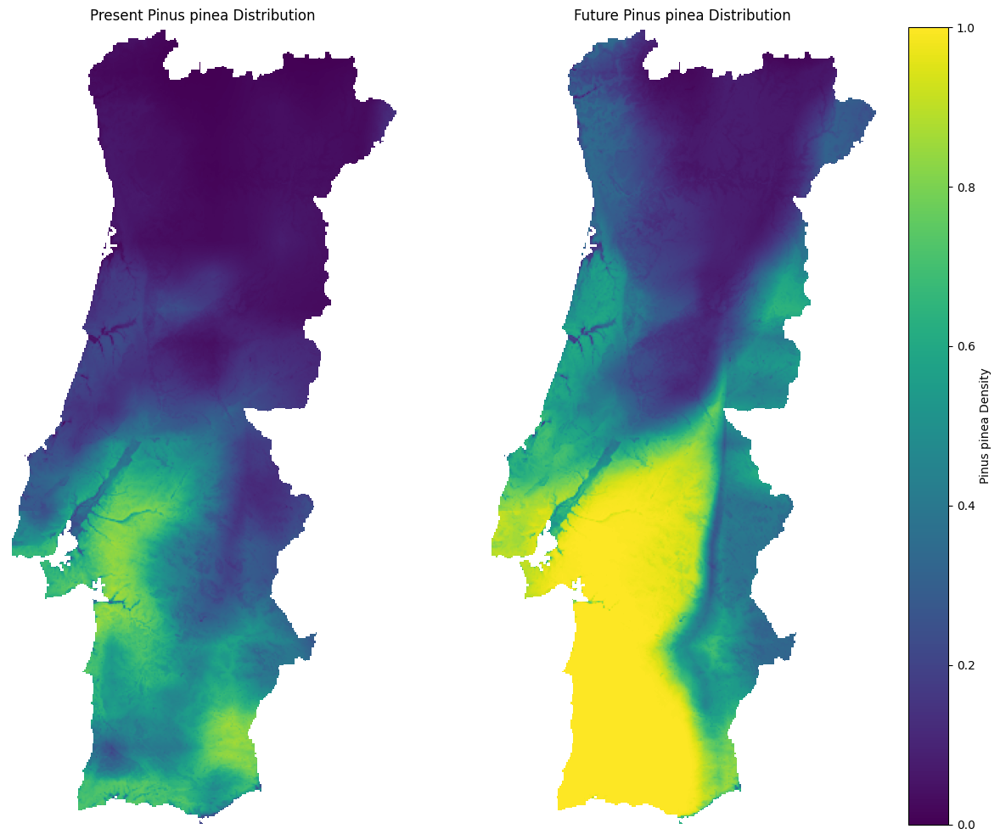

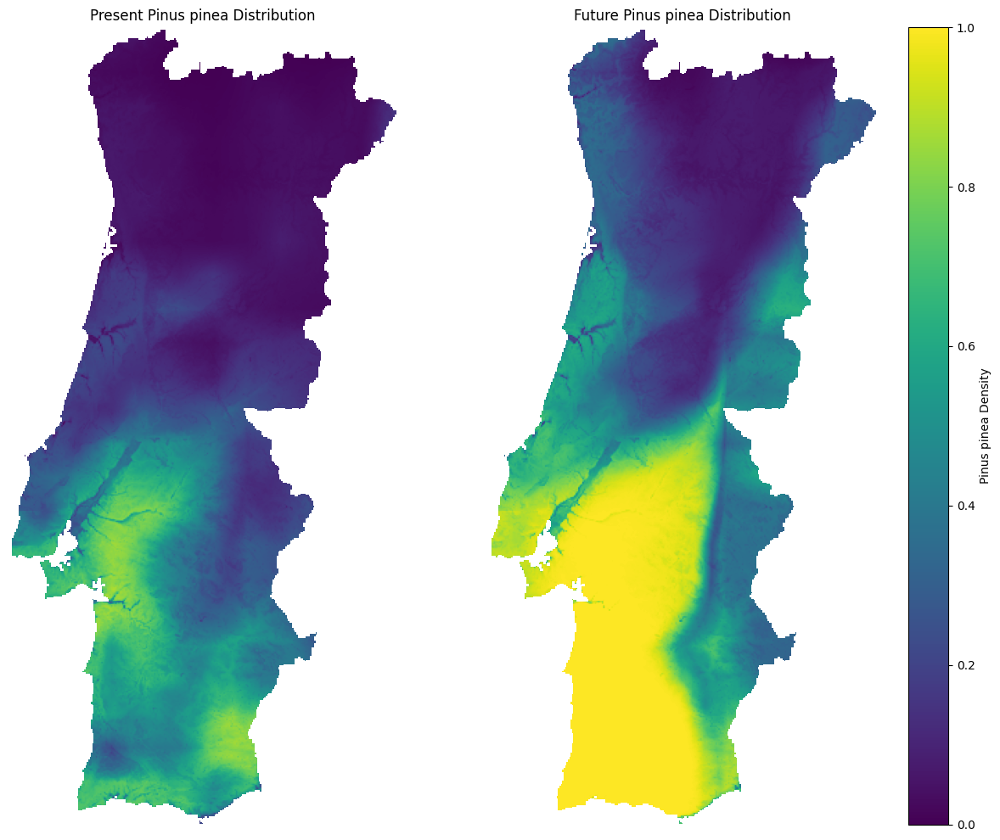

Quercus rotundifolia:


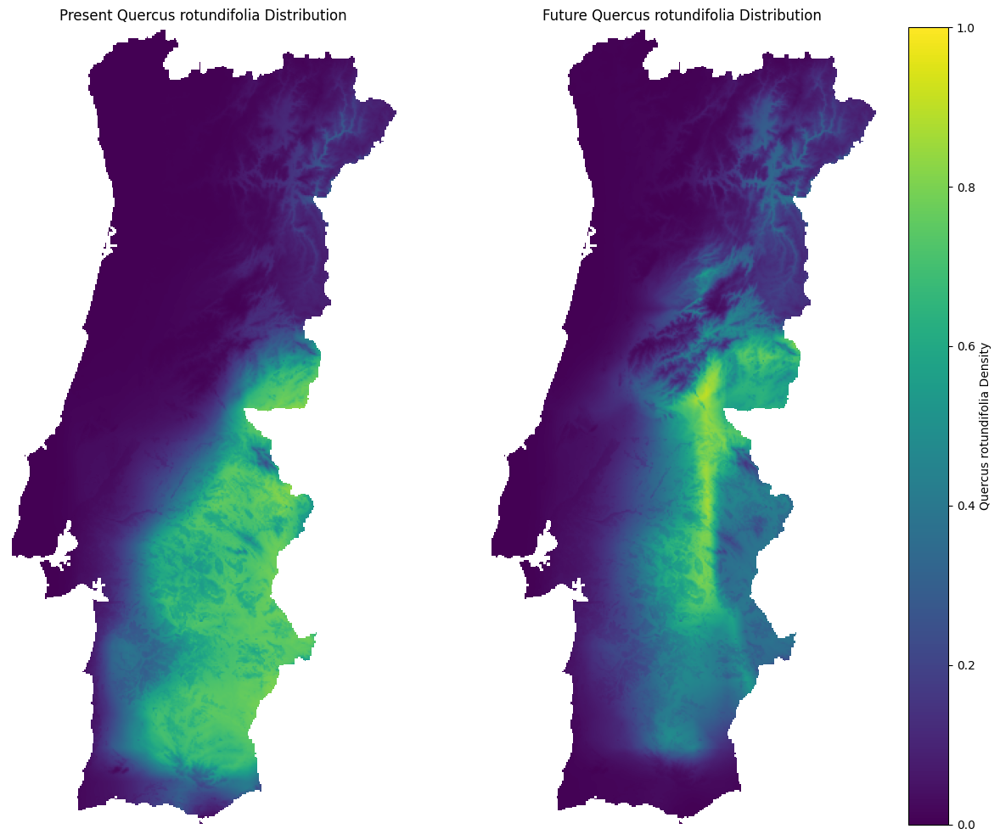

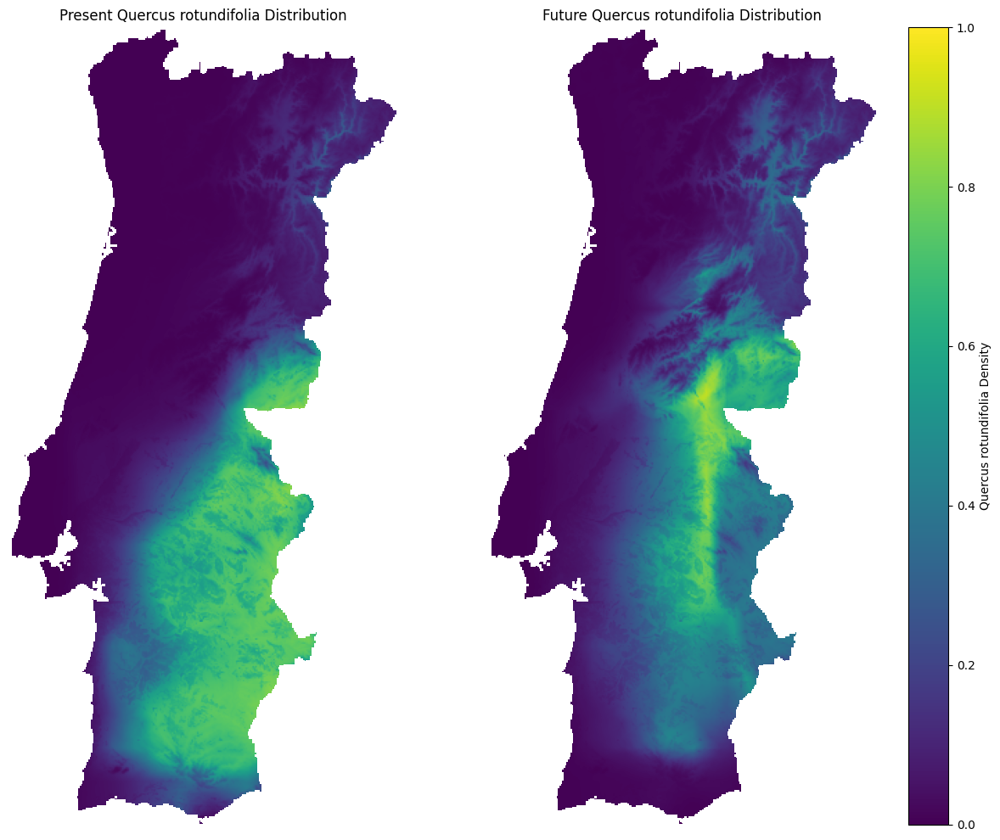

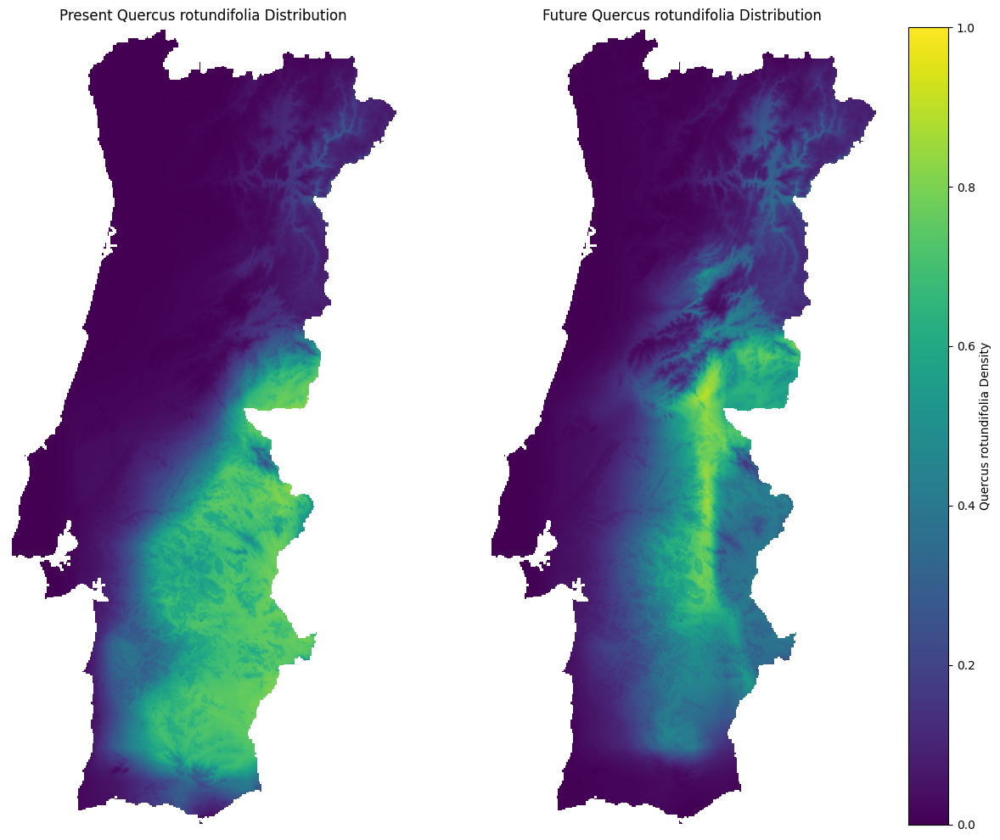

Quercus suber:


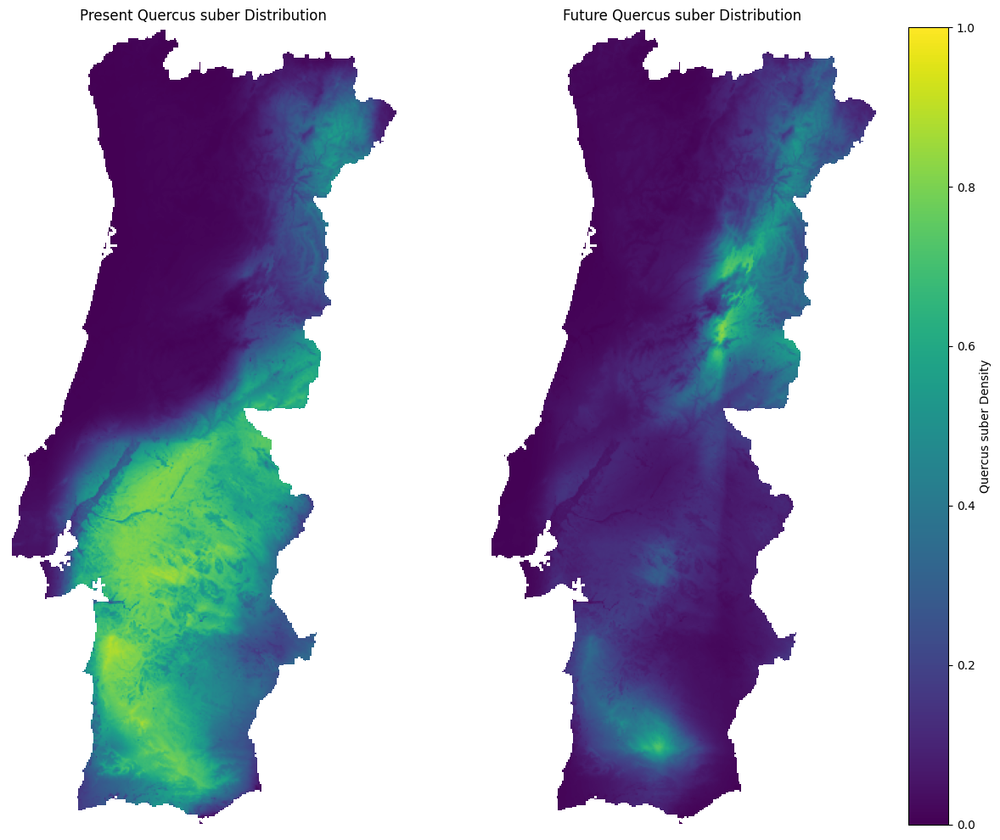

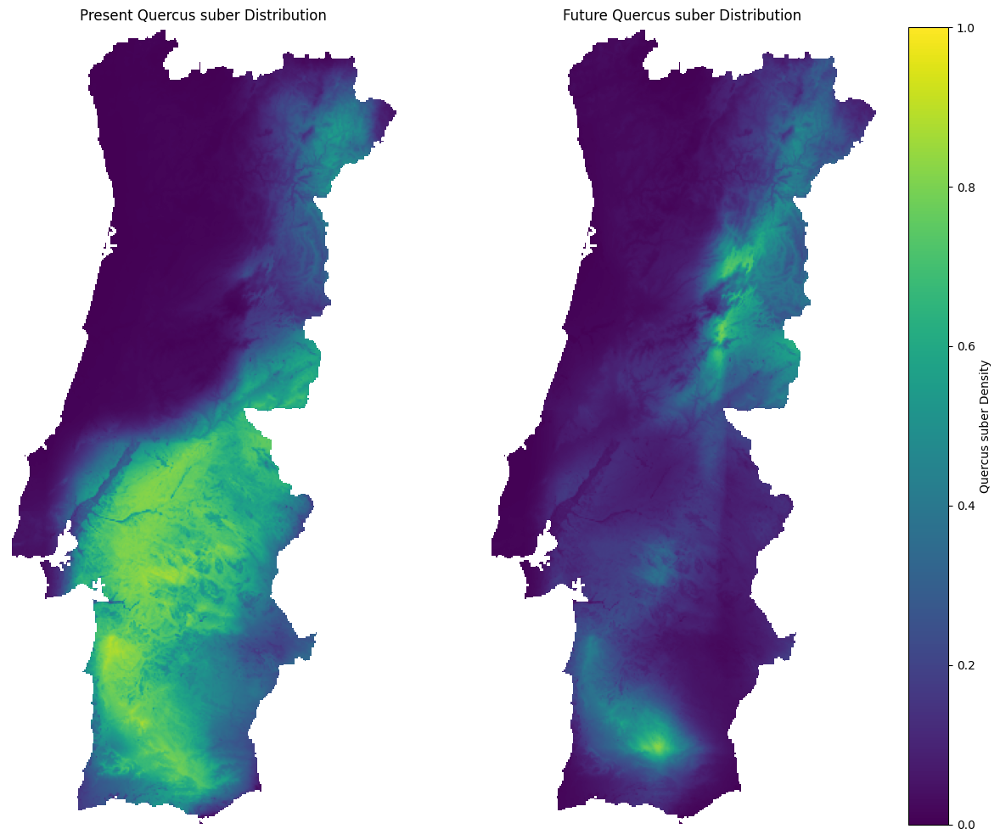

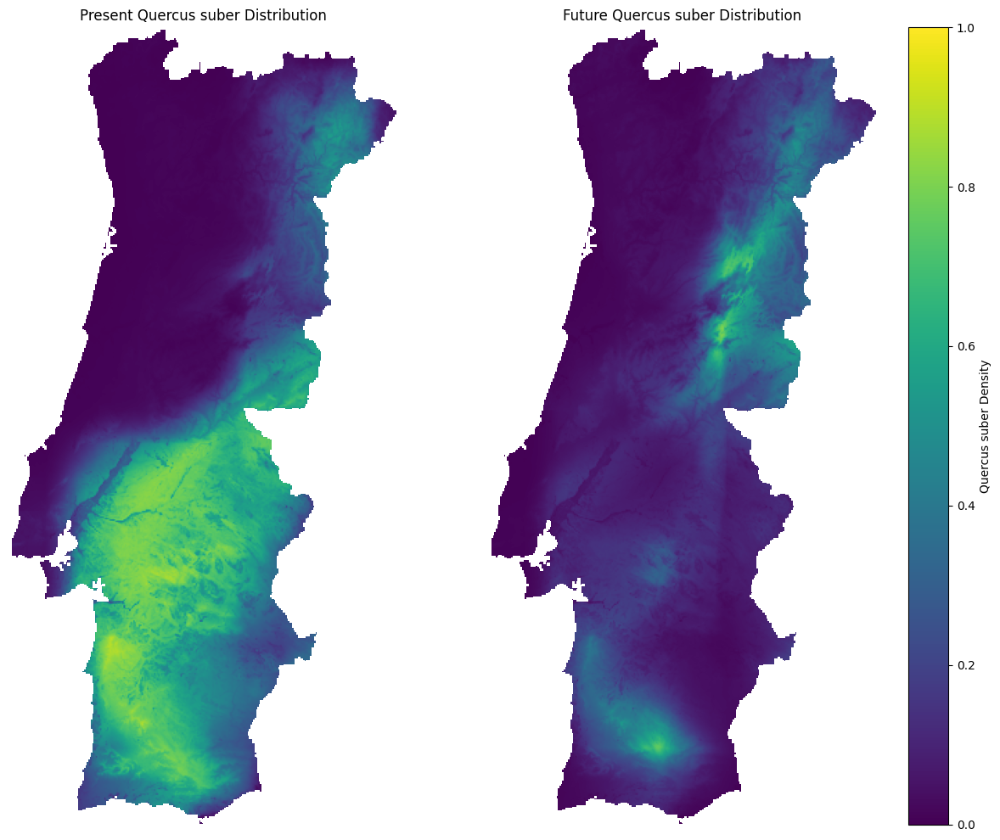

Plots for BIO-1 complete.


In [7]:
generate_species_plots(bio_var = 1)
# # generate_species_plots(bio_var = 14)